<a href="https://colab.research.google.com/github/raypaver/googleLMMM/blob/main/pymc_fullMMM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

PyMC-Marketing 0.10.0

https://www.pymc-marketing.io/en/stable/notebooks/mmm/mmm_case_study.html


In [2]:
pip install pymc-marketing

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.6/174.6 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.6/484.6 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 45.9 MB/s eta 0:00:00
  Attempting uninstall: pytensor
    Found existing installation: pytensor 2.25.5
    Uninstalling pytensor-2.25.5:
      Successfully uninstalled pytensor-2.25.5
  Attempting uninstall: pymc
    Found existing installation: pymc 5.16.2
    Uninstalling pymc-5.16.2:
      Successfully uninstalled pymc-5.16.2


In [17]:
!pip install numpyro

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 351.1/351.1 kB 6.8 MB/s eta 0:00:00


In [3]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from pymc_marketing.metrics import crps
from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.utils import apply_sklearn_transformer_across_dim
from pymc_marketing.prior import Prior

warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [4]:
seed: int = sum(map(ord, "mmm"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

In [5]:
raw_df = pd.read_csv("https://raw.githubusercontent.com/sibylhe/mmm_stan/main/data.csv")

# 1. control variables
# We just keep the holidays columns
control_columns = [col for col in raw_df.columns if "hldy_" in col]


# 2. media variables
channel_columns_raw = [
    col
    for col in raw_df.columns
    if "mdsp_" in col
    and col != "mdsp_viddig"
    and col != "mdsp_auddig"
    and col != "mdsp_sem"
]


channel_mapping = {
    "mdsp_dm": "Direct Mail",
    "mdsp_inst": "Insert",
    "mdsp_nsp": "Newspaper",
    "mdsp_audtr": "Radio",
    "mdsp_vidtr": "TV",
    "mdsp_so": "Social Media",
    "mdsp_on": "Online Display",
}

channel_columns = list(channel_mapping.values())

# 3. sales variables
sales_col = "sales"

data_df = raw_df[["wk_strt_dt", sales_col, *channel_columns_raw, *control_columns]]
data_df = data_df.rename(columns=channel_mapping)


# 4. Date column
data_df["wk_strt_dt"] = pd.to_datetime(data_df["wk_strt_dt"])
date_column = "wk_strt_dt"

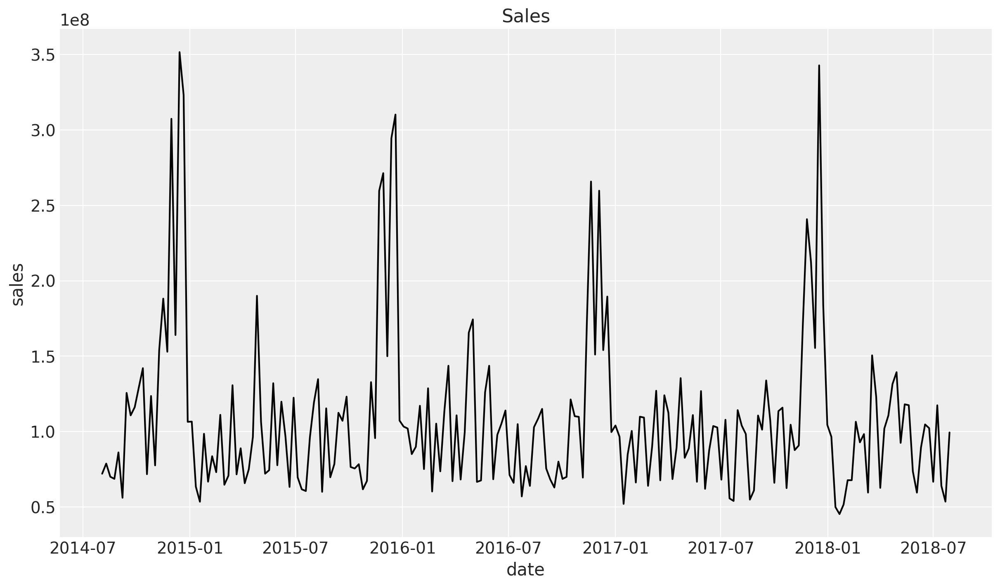

In [6]:
fig, ax = plt.subplots()
sns.lineplot(data=data_df, x=date_column, y="sales", color="black", ax=ax)
ax.set(title="Sales", xlabel="date", ylabel="sales");

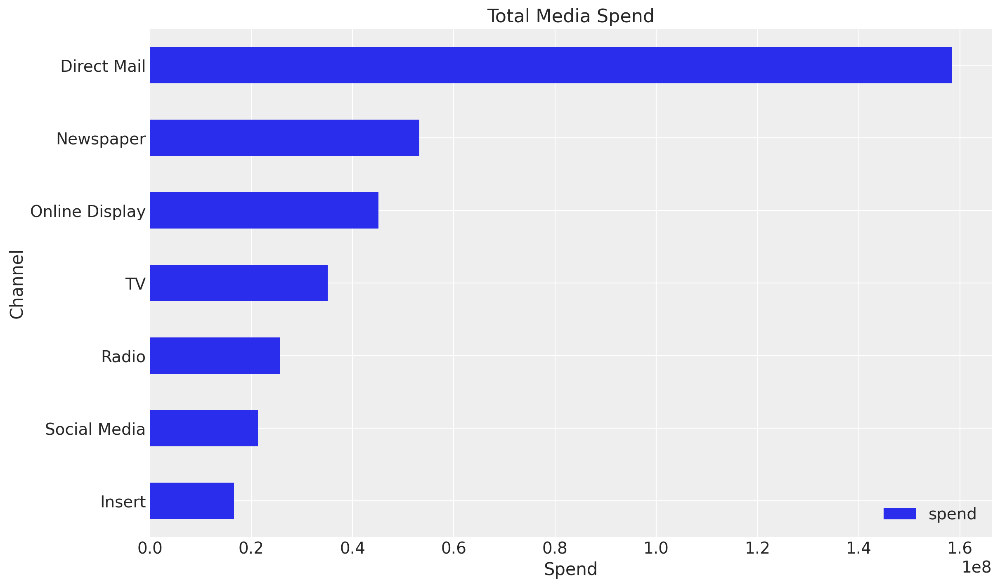

In [7]:
fig, ax = plt.subplots()
data_df.melt(
    value_vars=channel_columns, var_name="channel", value_name="spend"
).groupby("channel").agg({"spend": "sum"}).sort_values(by="spend").plot.barh(ax=ax)
ax.set(title="Total Media Spend", xlabel="Spend", ylabel="Channel");

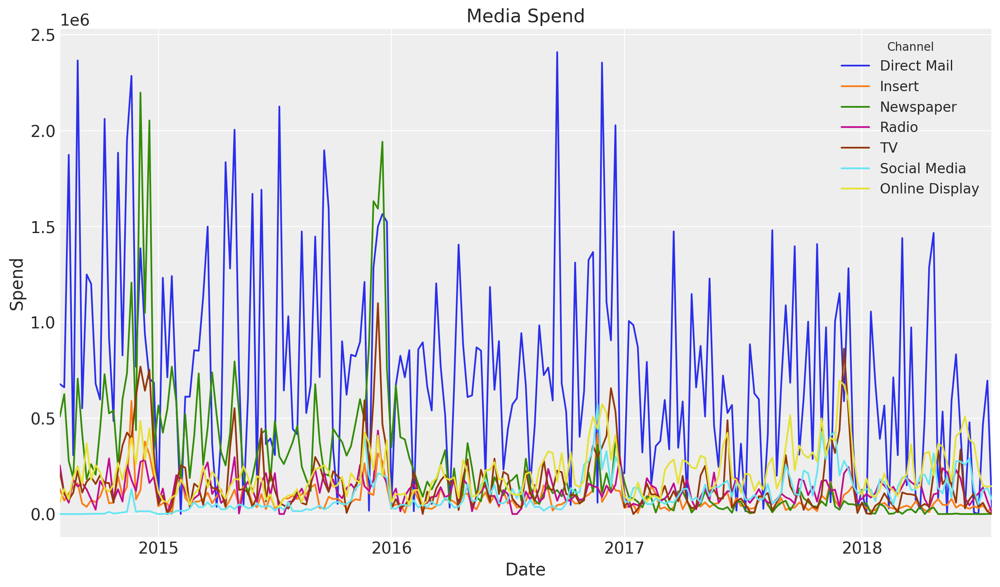

In [8]:
fig, ax = plt.subplots()
data_df.set_index("wk_strt_dt")[channel_columns].plot(ax=ax)
ax.legend(title="Channel", fontsize=12)
ax.set(title="Media Spend", xlabel="Date", ylabel="Spend");

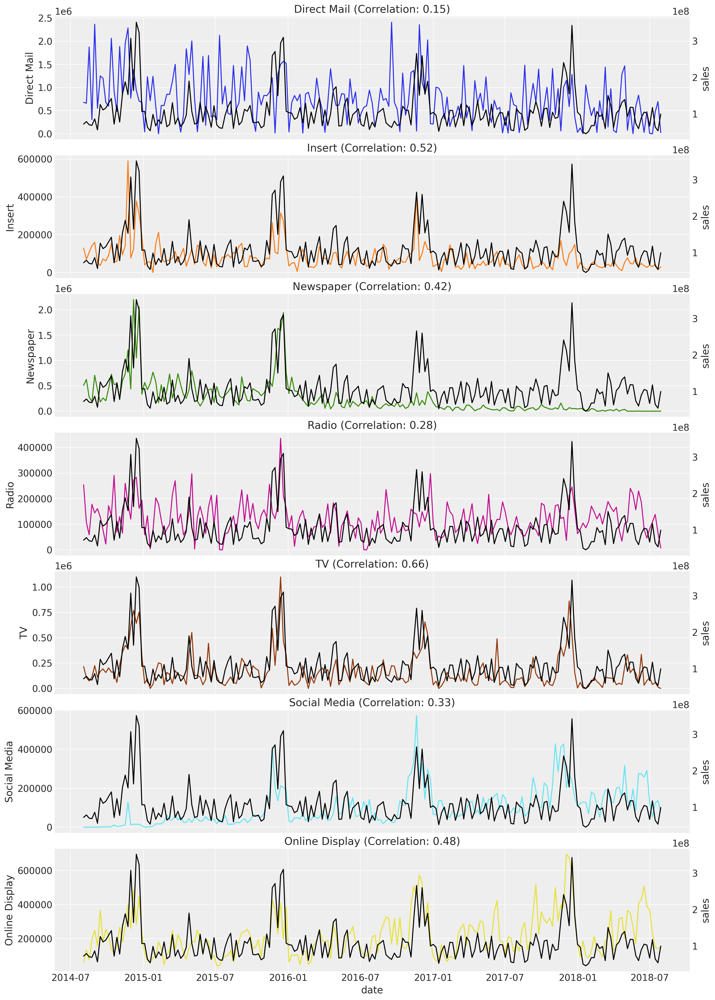

In [9]:
n_channels = len(channel_columns)

fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]
    ax_twin = ax.twinx()
    sns.lineplot(data=data_df, x=date_column, y=channel, color=f"C{i}", ax=ax)
    sns.lineplot(data=data_df, x=date_column, y=sales_col, color="black", ax=ax_twin)
    correlation = data_df[[channel, sales_col]].corr().iloc[0, 1]
    ax_twin.grid(None)
    ax.set(title=f"{channel} (Correlation: {correlation:.2f})")

ax.set_xlabel("date");

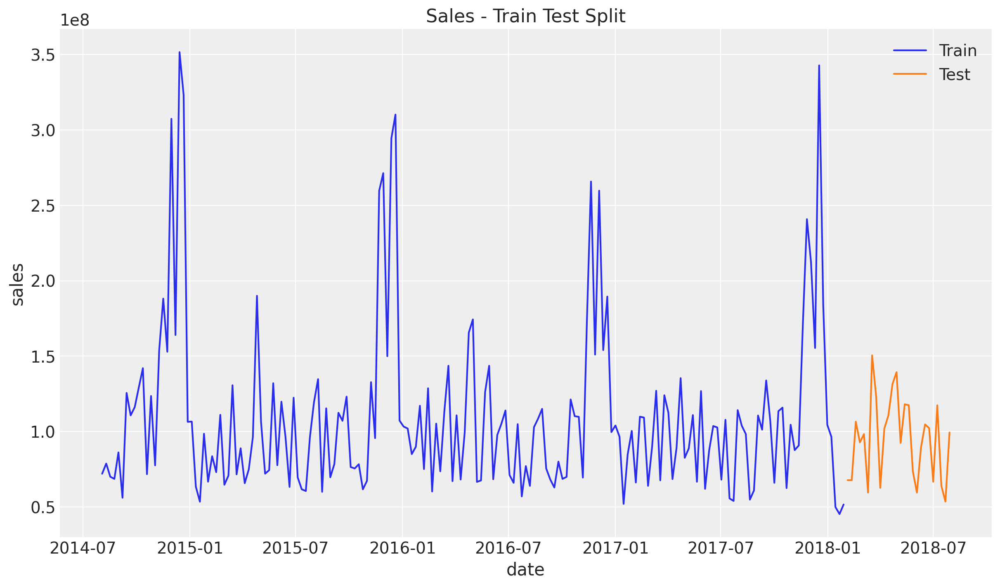

In [10]:
train_test_split_date = pd.to_datetime("2018-02-01")

train_mask = data_df.wk_strt_dt <= train_test_split_date
test_mask = data_df.wk_strt_dt > train_test_split_date

train_df = data_df[train_mask]
test_df = data_df[test_mask]

fig, ax = plt.subplots()
sns.lineplot(data=train_df, x="wk_strt_dt", y="sales", color="C0", label="Train", ax=ax)
sns.lineplot(data=test_df, x="wk_strt_dt", y="sales", color="C1", label="Test", ax=ax)
ax.set(title="Sales - Train Test Split", xlabel="date");

In [11]:
X_train = train_df.drop(columns=sales_col)
X_test = test_df.drop(columns=sales_col)

y_train = train_df[sales_col]
y_test = test_df[sales_col]

In [12]:
spend_shares = (
    X_train.melt(value_vars=channel_columns, var_name="channel", value_name="spend")
    .groupby("channel", as_index=False)
    .agg({"spend": "sum"})
    .sort_values(by="channel")
    .assign(spend_share=lambda x: x["spend"] / x["spend"].sum())["spend_share"]
    .to_numpy()
)

prior_sigma = spend_shares

In [13]:
model_config = {
    "intercept": Prior("Normal", mu=0, sigma=2),
    "saturation_beta": Prior("HalfNormal", sigma=prior_sigma, dims="channel"),
    "saturation_lam": Prior("Gamma", alpha=3, beta=1, dims="channel"),
    "gamma_control": Prior("Normal", mu=0, sigma=2.5),
    "gamma_fourier": Prior("Laplace", mu=0, b=2),
    "likelihood": Prior("Normal", sigma=Prior("Exponential", lam=1 / 3)),
}

In [14]:
sampler_config = {"progressbar": True}

mmm = MMM(
    model_config=model_config,
    sampler_config=sampler_config,
    date_column=date_column,
    adstock=GeometricAdstock(l_max=6),
    saturation=LogisticSaturation(),
    channel_columns=channel_columns,
    control_columns=control_columns,
    yearly_seasonality=5,
)

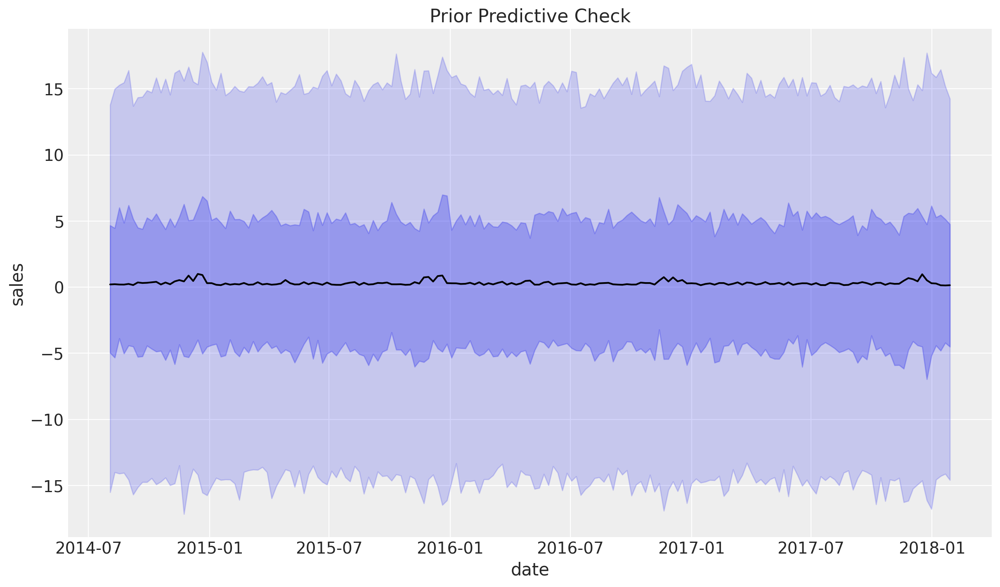

In [15]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X_train, y_train, samples=4_000)
fig = mmm.plot_prior_predictive()
fig.gca().set(xlabel="date", ylabel="sales");

In [18]:
mmm.fit(
    X=X_train,
    y=y_train,
    target_accept=0.9,
    chains=4,
    draws=3_000,
    nuts_sampler="numpyro",
    random_seed=rng,
)

  0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/4000 [00:00<?, ?it/s]

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

In [19]:
mmm.idata["sample_stats"]["diverging"].sum().item()

0

In [20]:
az.summary(
    data=mmm.idata,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)["r_hat"].describe()

,r_hat
count,55.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


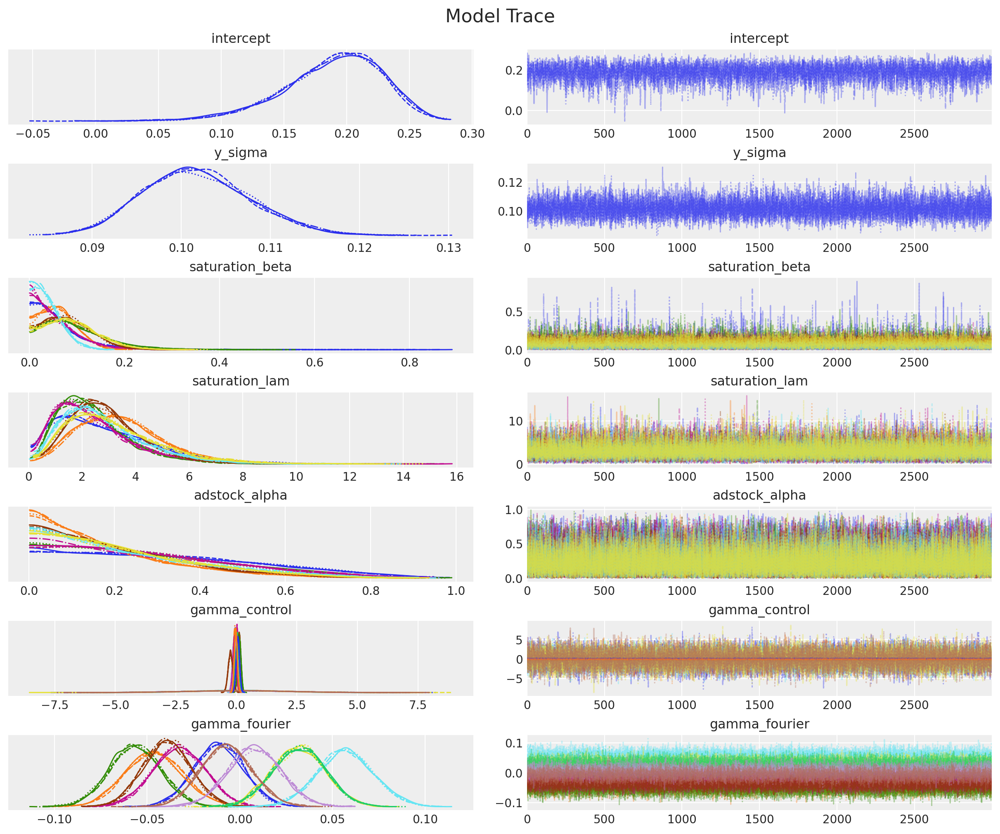

In [21]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

Output()

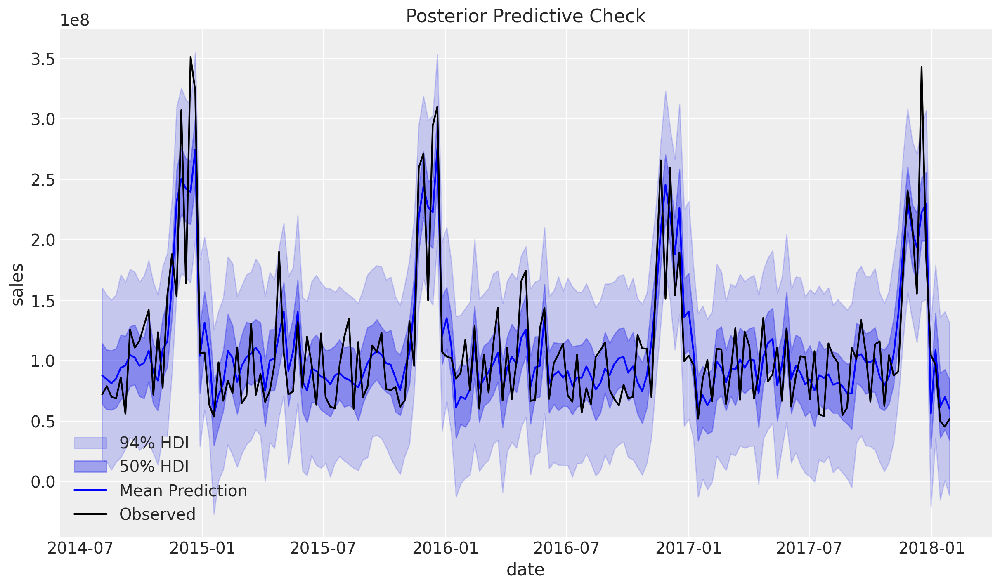

In [22]:
mmm.sample_posterior_predictive(X_train, extend_idata=True, combined=True)
fig = mmm.plot_posterior_predictive(original_scale=True)
fig.gca().set(xlabel="date", ylabel="sales");

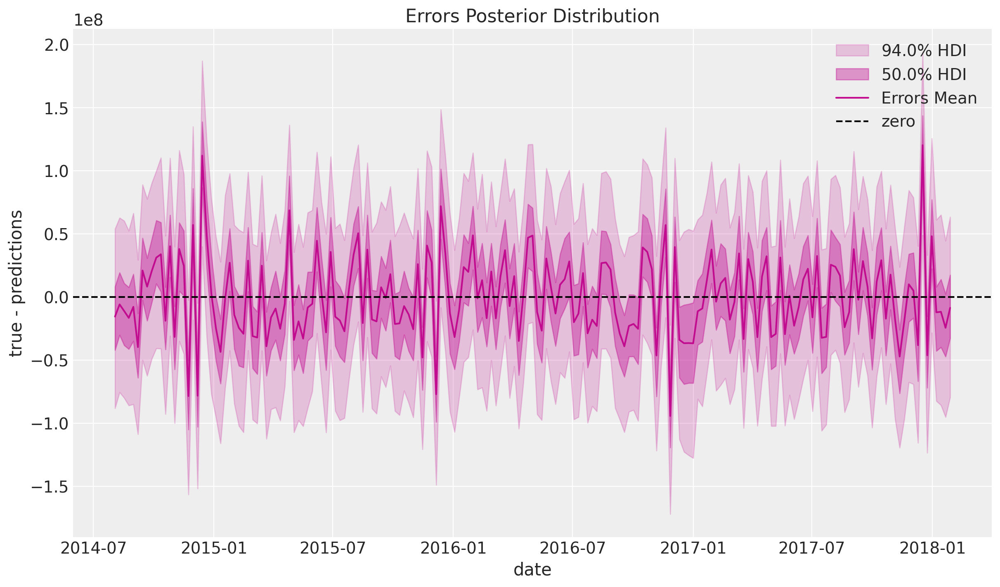

In [23]:
mmm.plot_errors(original_scale=True);

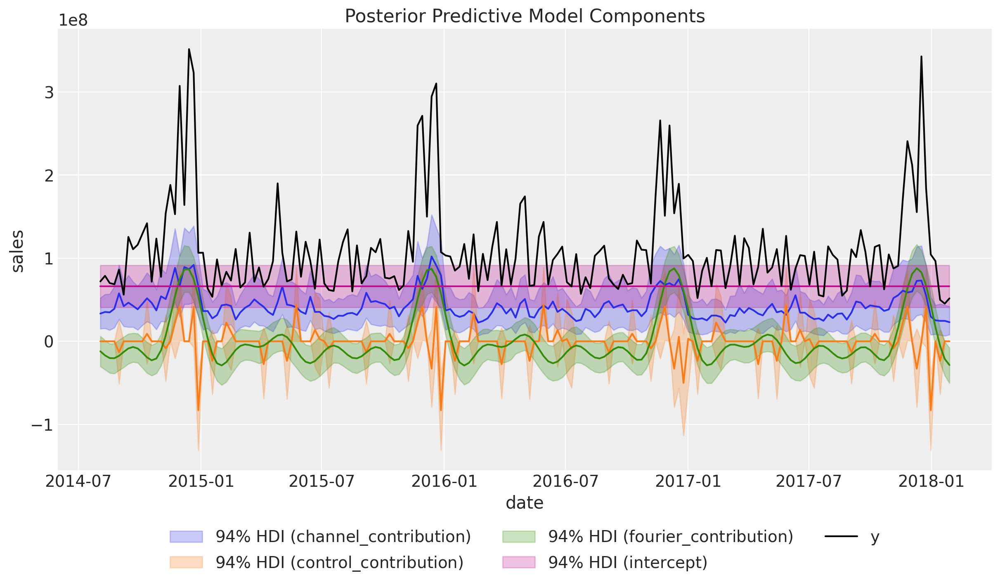

In [24]:
fig = mmm.plot_components_contributions(original_scale=True)
fig.gca().set(xlabel="date", ylabel="sales");

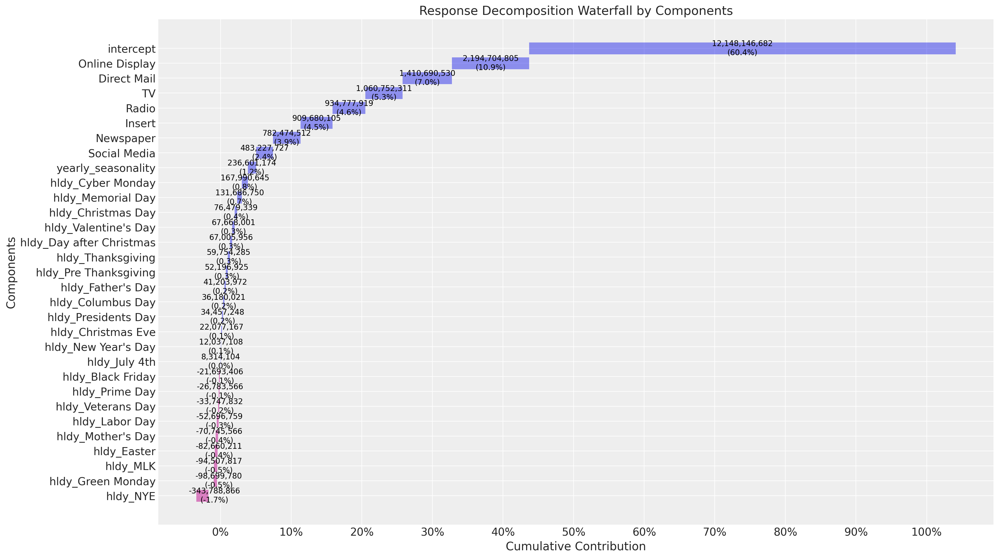

In [25]:
mmm.plot_waterfall_components_decomposition(figsize=(18, 10));

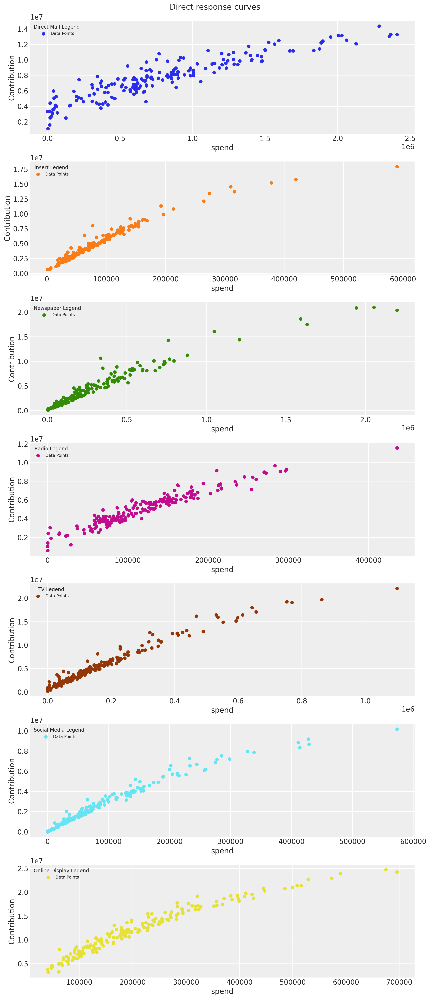

In [26]:
fig = mmm.plot_direct_contribution_curves()
[ax.set(xlabel="spend") for ax in fig.axes];

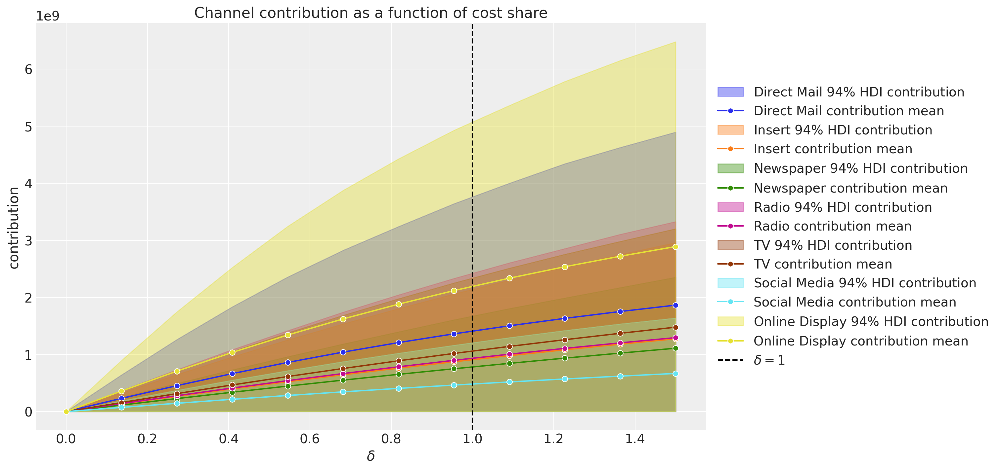

In [27]:
mmm.plot_channel_contributions_grid(start=0, stop=1.5, num=12, figsize=(15, 7));

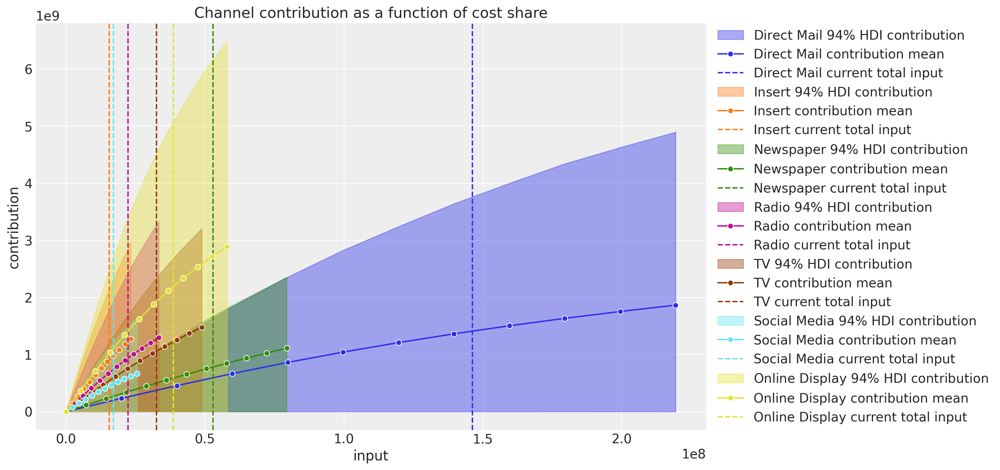

In [28]:
mmm.plot_channel_contributions_grid(
    start=0, stop=1.5, num=12, absolute_xrange=True, figsize=(15, 7)
);

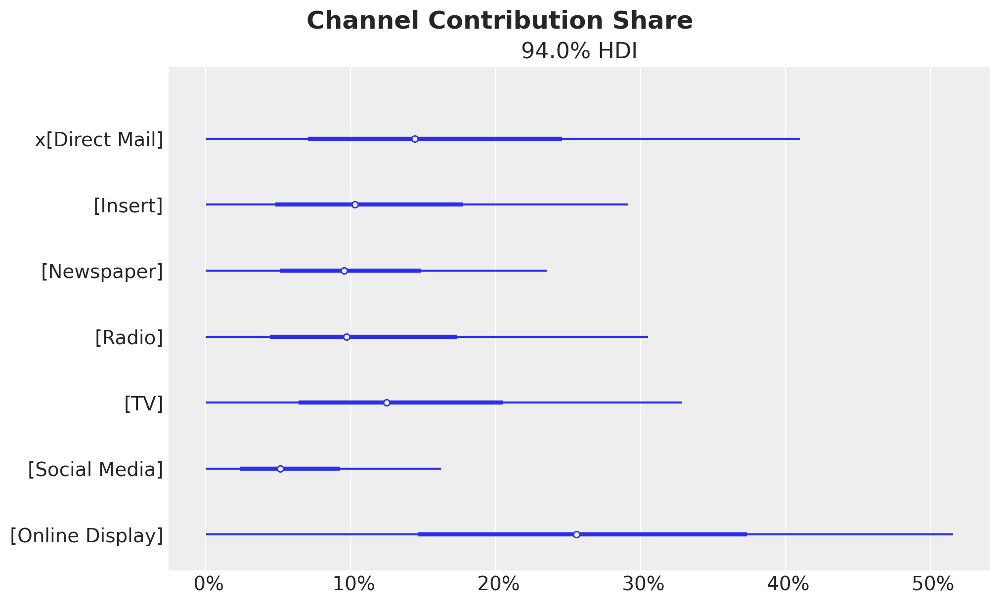

In [29]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

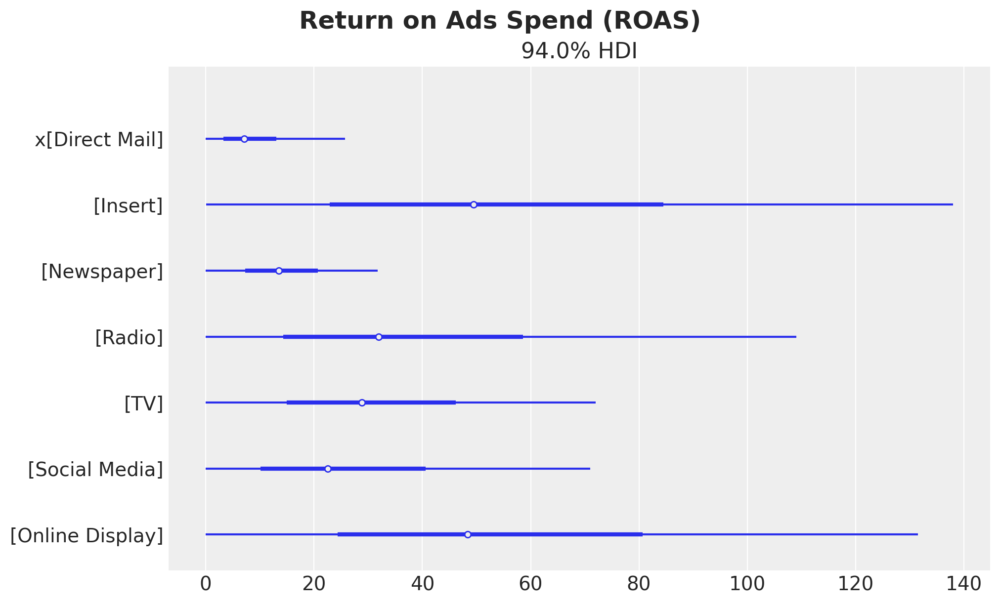

In [30]:
# Get the channel contributions on the original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Sum the contributions over the whole training period
spend_sum = X_train[channel_columns].sum().to_numpy()
spend_sum = spend_sum[
    np.newaxis, np.newaxis, :
]  # We need these extra dimensions to broadcast the spend sum to the shape of the contributions.

# Compute the ROAS as the ratio of the mean contribution and the spend for each channel
roas_samples = channel_contribution_original_scale.sum(dim="date") / spend_sum

# Plot the ROAS
fig, ax = plt.subplots(figsize=(10, 6))
az.plot_forest(roas_samples, combined=True, ax=ax)
fig.suptitle("Return on Ads Spend (ROAS)", fontsize=18, fontweight="bold");

In [31]:
y_pred_test = mmm.sample_posterior_predictive(
    X_pred=X_test,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contributions"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

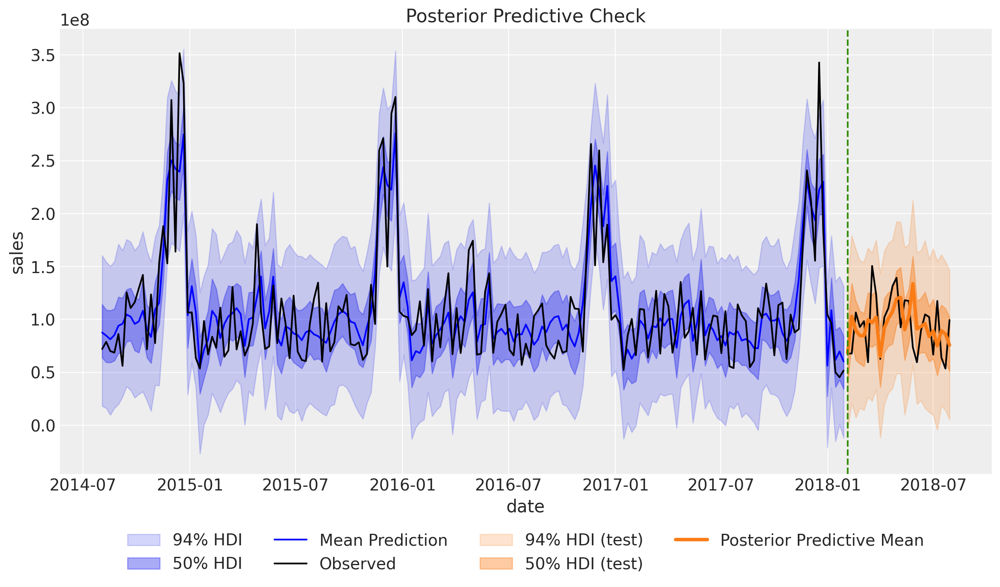

In [32]:
fig, ax = plt.subplots()
mmm.plot_posterior_predictive(original_scale=True, ax=ax)

test_hdi_94 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.94)
test_hdi_50 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.50)

ax.fill_between(
    X_test[date_column],
    test_hdi_94[:, 0],
    test_hdi_94[:, 1],
    color="C1",
    label=f"{0.94:.0%} HDI (test)",
    alpha=0.2,
)

ax.fill_between(
    X_test[date_column],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} HDI (test)",
    alpha=0.4,
)

ax.plot(X_test[date_column], y_test, color="black")
ax.plot(
    X_test[date_column],
    y_pred_test["y"].mean(dim="sample"),
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.axvline(X_test[date_column].iloc[0], color="C2", linestyle="--")
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(ylabel="sales");

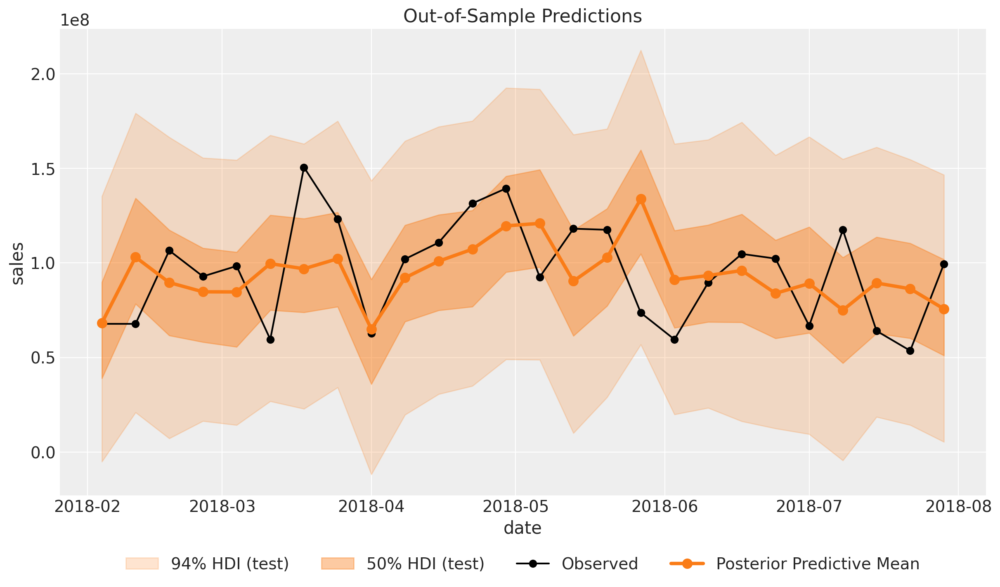

In [33]:
fig, ax = plt.subplots()
ax.fill_between(
    X_test[date_column],
    test_hdi_94[:, 0],
    test_hdi_94[:, 1],
    color="C1",
    label=f"{0.94:.0%} HDI (test)",
    alpha=0.2,
)
ax.fill_between(
    X_test[date_column],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} HDI (test)",
    alpha=0.4,
)
ax.plot(X_test[date_column], y_test, marker="o", color="black", label="Observed")
ax.plot(
    X_test[date_column],
    y_pred_test["y"].mean(dim="sample"),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(title="Out-of-Sample Predictions", xlabel="date", ylabel="sales");

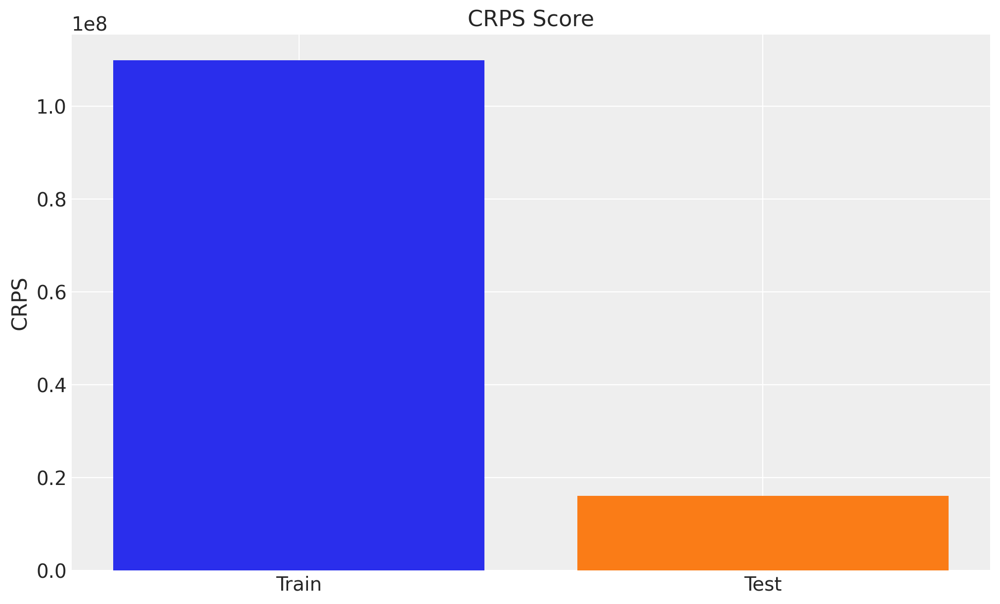

In [34]:
crps_train = crps(
    y_true=y_train.to_numpy(),
    y_pred=az.extract(mmm.idata["posterior_predictive"], var_names=["y"]).T,
)

crps_test = crps(y_true=y_test.to_numpy(), y_pred=y_pred_test["y"].T)

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(["Train", "Test"], [crps_train, crps_test], color=["C0", "C1"])
ax.set(ylabel="CRPS", title="CRPS Score");

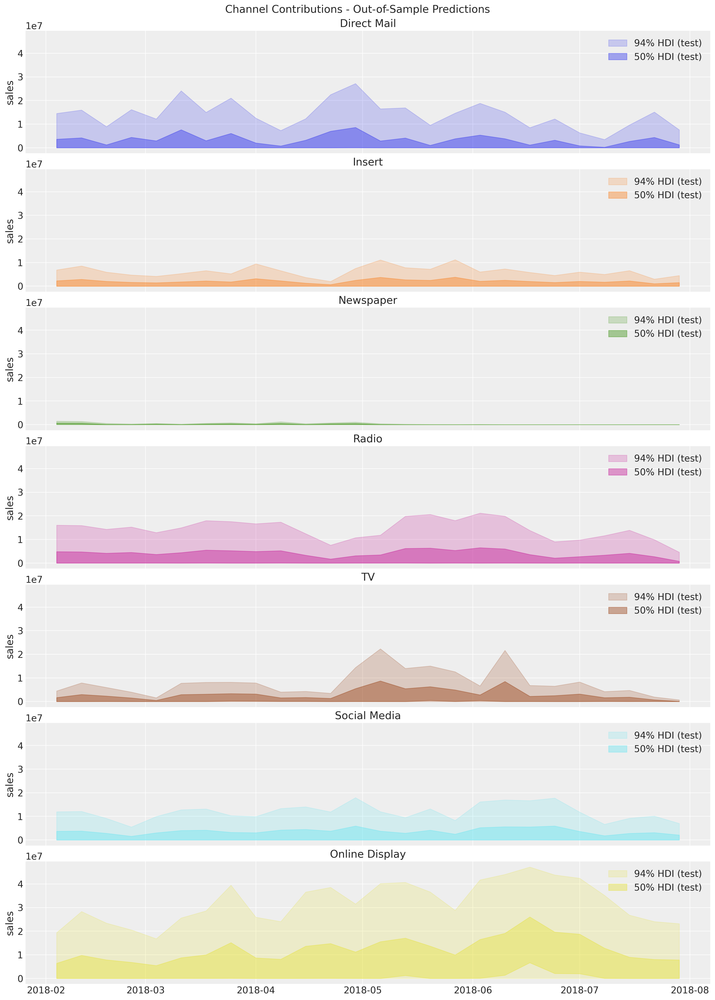

In [35]:
fig, axes = plt.subplots(
    nrows=len(channel_columns),
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=True,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    for j, hdi_prob in enumerate([0.94, 0.5]):
        ax = axes[i]
        az.plot_hdi(
            X_test[date_column],
            y_pred_test["channel_contributions"]
            .sel(channel=channel)
            .unstack()
            .transpose(..., "date"),
            hdi_prob=hdi_prob,
            color=f"C{i}",
            smooth=False,
            fill_kwargs={"alpha": 0.2 + 0.2 * j, "label": f"{hdi_prob:.0%} HDI (test)"},
            ax=ax,
        )
    ax.legend(loc="upper right")
    ax.set(title=channel, ylabel="sales")

fig.suptitle("Channel Contributions - Out-of-Sample Predictions", fontsize=16);

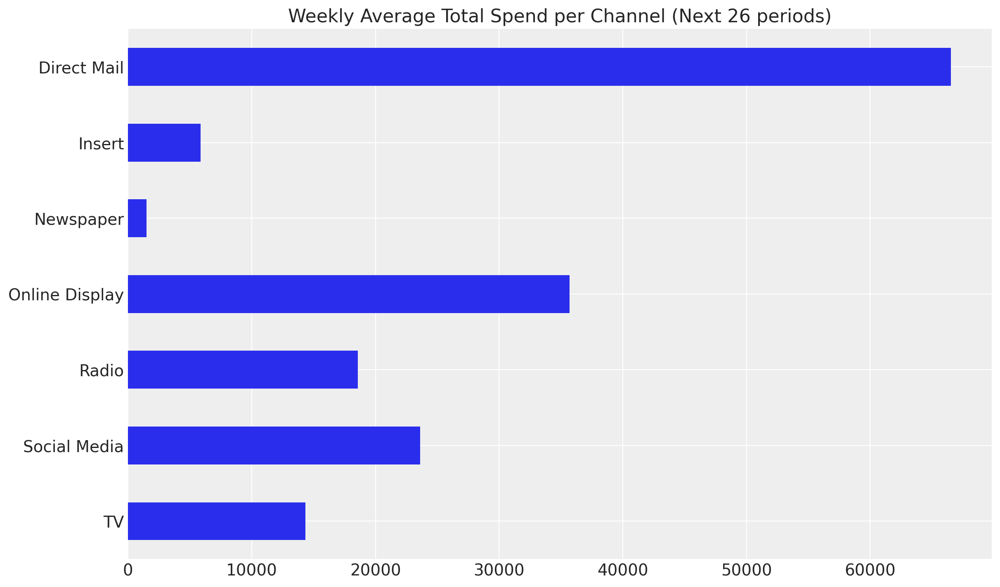

In [36]:
num_periods = X_test[date_column].shape[0]

budget = X_test[channel_columns].sum(axis=0).sum() / (
    num_periods * len(channel_columns)
)

fig, ax = plt.subplots()
(
    X_test[channel_columns]
    .sum(axis=0)
    .div(num_periods * len(channel_columns))
    .sort_index(ascending=False)
    .plot.barh(ax=ax)
)
ax.set(title=f"Weekly Average Total Spend per Channel (Next {num_periods} periods)");

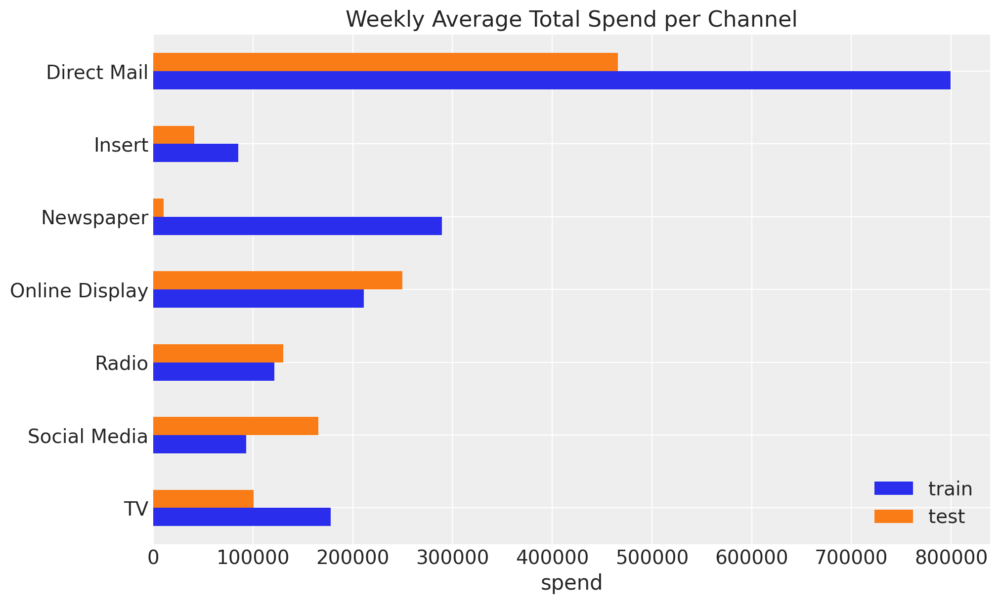

In [37]:
fig, ax = plt.subplots(figsize=(10, 6))
X_train[channel_columns].mean(axis=0).to_frame(name="train").join(
    other=X_test[channel_columns].mean(axis=0).to_frame(name="test"),
    how="inner",
).sort_index(ascending=False).plot.barh(ax=ax)
ax.set(title="Weekly Average Total Spend per Channel", xlabel="spend");

In [38]:
percentage_change = 0.5

mean_spend_per_period_test = (
    X_test[channel_columns].sum(axis=0).div(num_periods * len(channel_columns))
)

budget_bounds = {
    key: [(1 - percentage_change) * value, (1 + percentage_change) * value]
    for key, value in (mean_spend_per_period_test).to_dict().items()
}

In [39]:
response = mmm.allocate_budget_to_maximize_response(
    budget=budget,
    time_granularity="weekly",
    num_periods=num_periods,
    budget_bounds=budget_bounds,
    noise_level=0.05,
    minimize_kwargs={
        "method": "SLSQP",
        "options": {"ftol": 1e-9, "maxiter": 5_000},
    },
)

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2205: UserWarning: Using default equality constraint: The sum of all budgets should be equal to the total budget.
  self.optimal_allocation_dict, _ = allocator.allocate_budget(


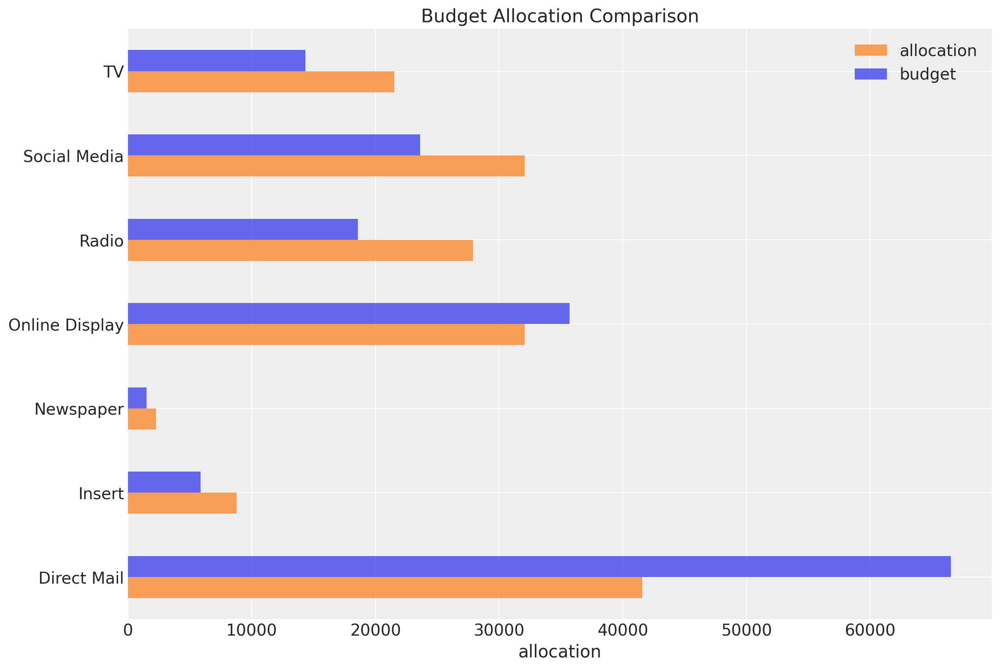

In [40]:
fig, ax = plt.subplots()

(
    pd.Series(mmm.optimal_allocation_dict)
    .to_frame(name="allocation")
    .join(mean_spend_per_period_test.to_frame(name="budget"))
    .sort_index()
    .plot.barh(figsize=(12, 8), color=["C1", "C0"], alpha=0.7, ax=ax)
)
ax.set(title="Budget Allocation Comparison", xlabel="allocation");

In [41]:
np.testing.assert_allclose(
    mean_spend_per_period_test.sum(), sum(mmm.optimal_allocation_dict.values())
)

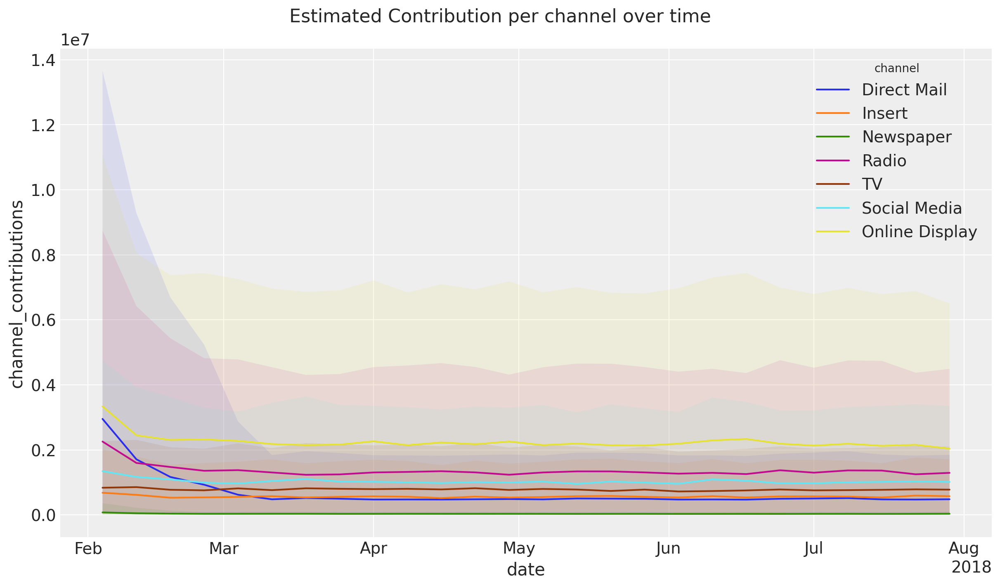

In [42]:
fig = mmm.plot_allocated_contribution_by_channel(samples=response)
fig.suptitle("Estimated Contribution per channel over time", fontsize=16);

/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2314: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7f783d6163e0> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)
/usr/local/lib/python3.10/dist-packages/pymc_marketing/mmm/mmm.py:2314: UserWarning: The label '_nolegend_' of <matplotlib.patches.Rectangle object at 0x7f783d27f730> starts with '_'. It is thus excluded from the legend.
  ax.legend(bars, labels)


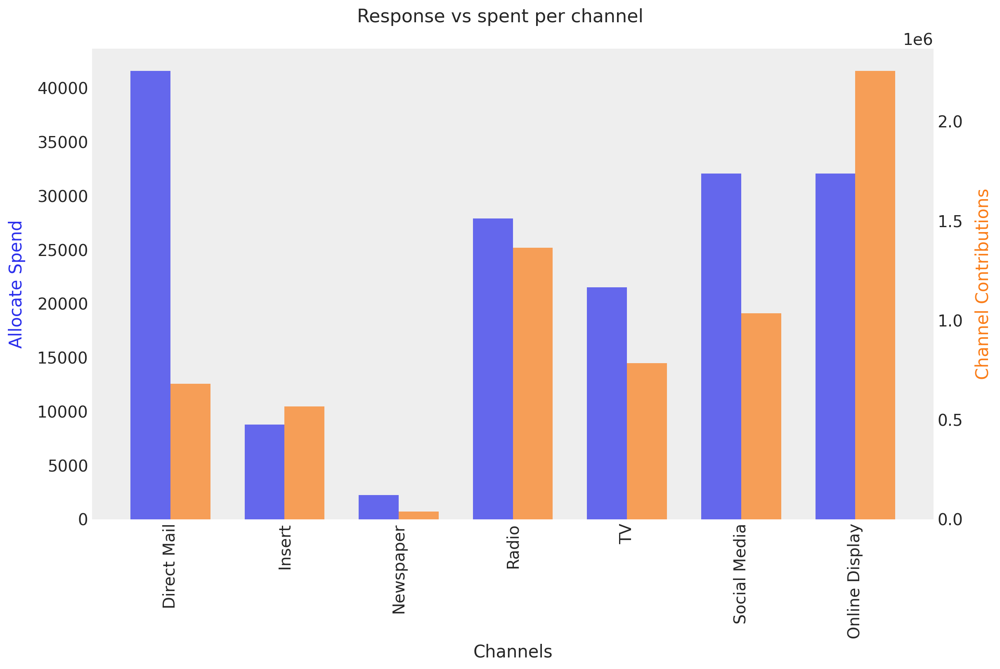

In [43]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
fig.suptitle("Response vs spent per channel", fontsize=16);

In [44]:
X_actual_uniform = X_test.copy()

for channel in channel_columns:
    X_actual_uniform[channel] = mean_spend_per_period_test[channel]

for control in control_columns:
    X_actual_uniform[control] = 0.0

pred_test_uniform = mmm.sample_posterior_predictive(
    X_pred=X_actual_uniform,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contributions"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

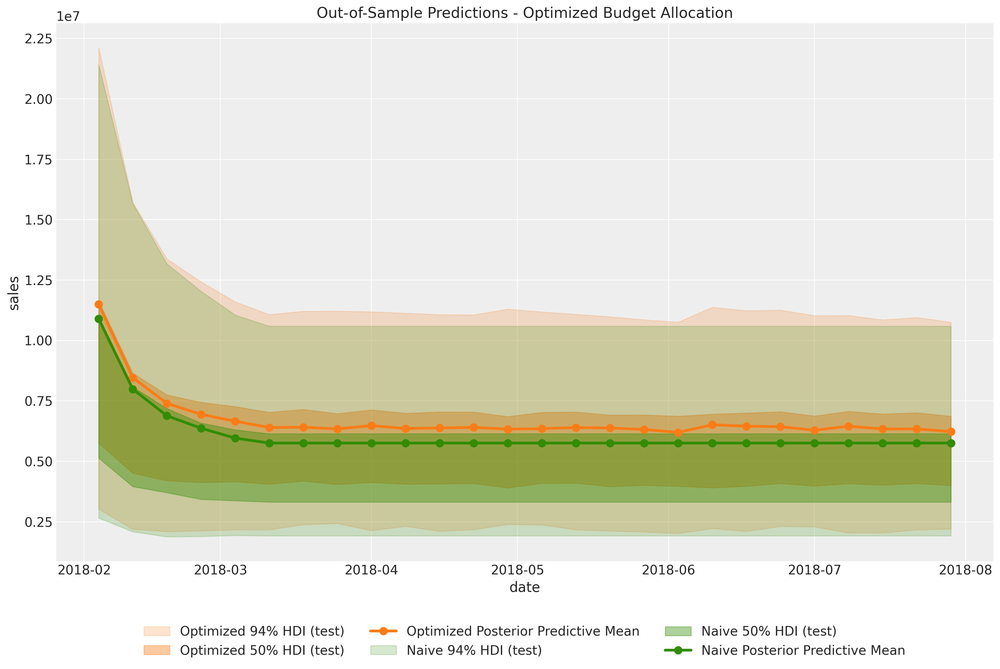

In [45]:
response_channel_contribution_original_scale = apply_sklearn_transformer_across_dim(
    data=response["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)


fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    response_channel_contribution_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date")
    .mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

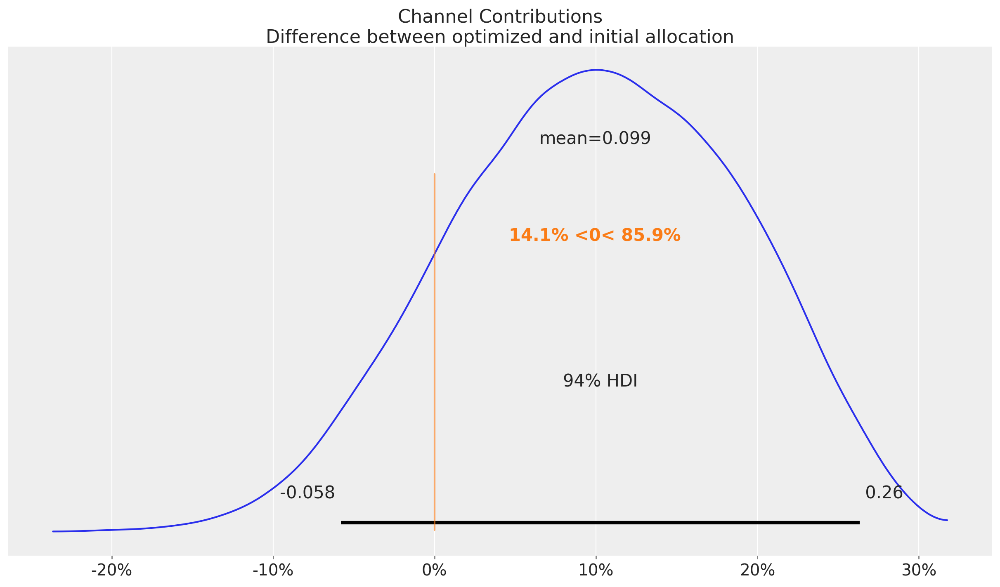

In [46]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        response_channel_contribution_original_scale.sum(dim="date")
        - pred_test_uniform["channel_contributions"]
        .unstack()
        .sum(dim="channel")
        .transpose(..., "date")
        .sum(dim="date")
    )
    / response_channel_contribution_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(
    title="Channel Contributions\nDifference between optimized and initial allocation"
);

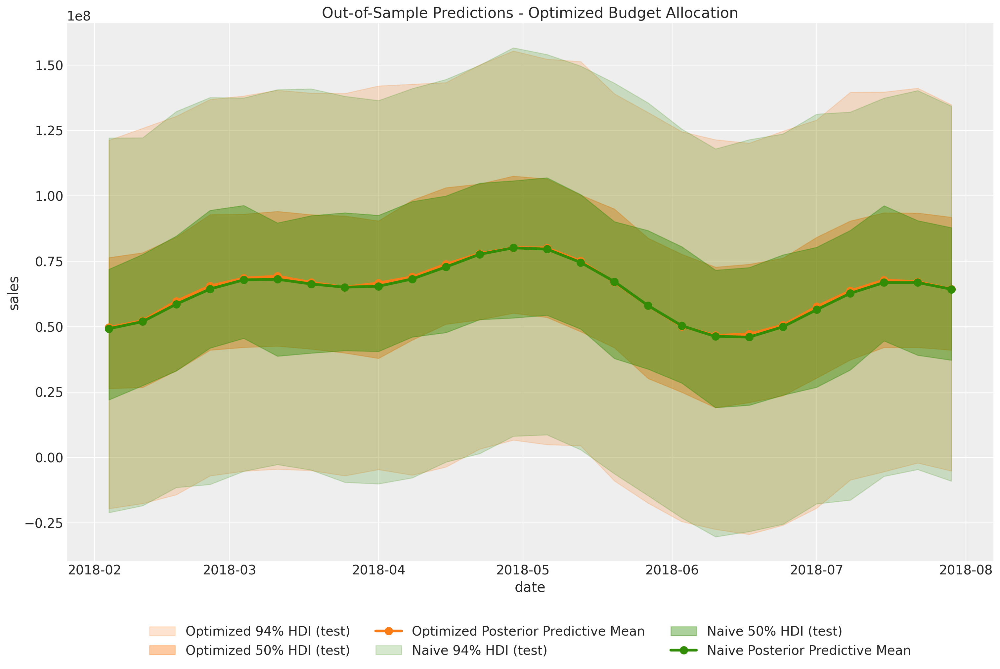

In [47]:
y_response_original_scale = apply_sklearn_transformer_across_dim(
    data=response["y"].unstack().transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    y_response_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date"),
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date"),
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date").mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

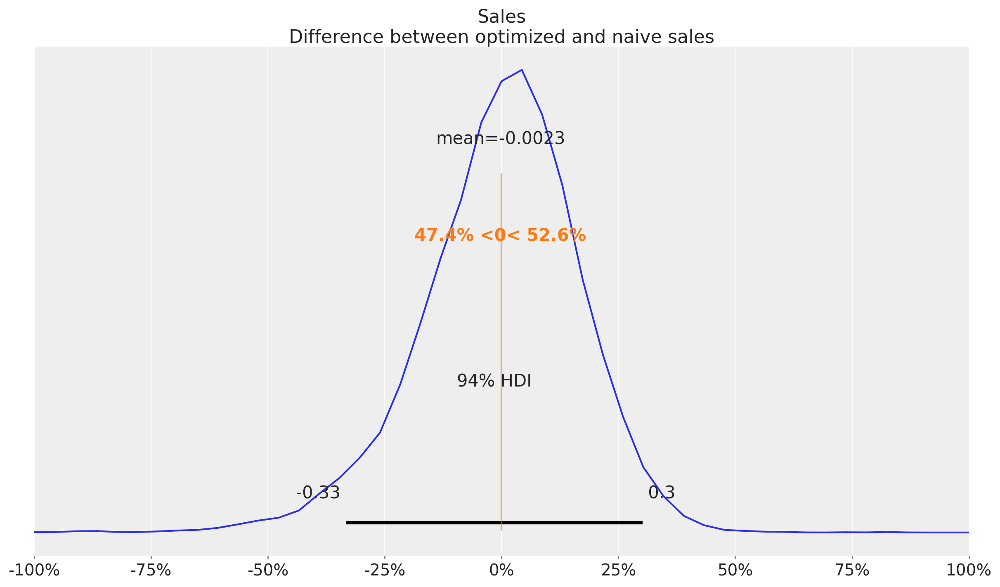

In [48]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        y_response_original_scale.sum(dim="date")
        - pred_test_uniform["y"].unstack().sum(dim="date")
    )
    / y_response_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(title="Sales\nDifference between optimized and naive sales", xlim=(-1, 1));